In [1]:
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import numpy as np
import sympy as sp
from scipy.integrate import odeint
from scipy.optimize import fsolve
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from matplotlib.animation import FuncAnimation, PillowWriter
import copy
import random


# Spatial extention

In the papers supplements a 2D lattice with periodic boundaries is used, to be precise, their code used 2 matrices for opinion and learning style. The elements i,j of the opinion matrix were updated according to the elements i,j of the learning style matrix. This allows fast computation and parallel updating of all opinions. 

Here I am using the NetworkX package instead, although it is slower, it gives me the advantage of being able to change network properties while still being able to use all the other functions written. Also, the node opinions are updated in a random order (allows repetition and doesn't make sure every node is selected). This should reduce the chance of periodic repetition and increase the chance and pace of convergence.

In [28]:

def create_lattice_network(rows, cols, s, seed, periodic_boundaries = True, x0 =0.5):
    """creation of the network

    *for now nodes are just connected in a grid like form but I'd like to make it triangular in future

    Args:
        rows * cols = give the amount of nodes in the network
        s = fraction of the nodes that will own the attribute of being a social learner, 1 -s = fraction of nodes being individual learners
        periodic_boundaries (bool, optional) = a switch for connecting the nodes at the borders to get rid of artifacts
        x0 = proportion of starting opinion 1?   

    Returns:
        nx.Graph , matrix of learning_style, matric of opinion initial values

    """


    G = nx.Graph()
    
    # Add nodes
    np.random.seed(seed)
    for i in range(rows):
        for j in range(cols):
            opinion = np.random.choice(2, 1,p=[1-x0,x0])
            ind_learning = np.random.choice(2,1,p=[s,1-s])
            G.add_node((i, j), opinion = opinion[0], ind_learning = ind_learning [0] )
    
    # Add edges
    for i in range(rows):
        for j in range(cols):
            if i < rows - 1:
                G.add_edge((i, j), (i + 1, j))
            if i == rows - 1:
                G.add_edge((i, j), (0 , j))
            if j < cols - 1:
                G.add_edge((i, j), (i, j + 1))
        if (periodic_boundaries == True) and (i == rows - 1):
            G.add_edge((i, j), (0, j ))
        if (periodic_boundaries == True) and (j == cols - 1):
                G.add_edge((i, j), (i , 0))


    learning = np.array([G.nodes[node]['ind_learning'] for node in G.nodes()])
    learning_matrix = np.transpose(np.reshape(learning, (rows,cols) ))
    opinion = np.array([G.nodes[node]['opinion'] for node in G.nodes()])
    opinion_matrix = np.transpose(np.reshape(opinion, (rows,cols) ))
    
    return G , learning_matrix, opinion_matrix

# Define lattice dimensions

def f( x, alpha):

    """
    conformity function. 
    x = dependent variable, proportion of people favoring X in whole group 
    alpha = shape parameter. 
    alpha >1 -> s-shape
    alpha <1 -> inverse s-shape
    alpha = 1 -> linear
    """
    if (x>=0 and x<=0.5):
        
        y = ((2 * x)**alpha)/ 2
    elif (x>0.5 and x <=1):
        y =  1 - ((2 * (1 - x)) ** alpha) / 2
    else:
        y = 0
    return y

def update_all(G, rows, cols, m, alpha,seed, flag1 = False, updatesteps = 500): 
    """opinion update function: 
    nodes will be selected in random order and their opinion will be updated according to their learning styles. 
    for social learners based on the proportional merit of the option, and for social learners according to the conformity fucntion f.

    *nodeselection will need to find another method, probbably random.sample so no more rows and cols
    import random
    random_nodes = random.sample(list(G.nodes()), 1)
    random_nodes[0]

    Args:
        G (_type_): nx.Graoh
        rows (_type_): _description_
        cols (_type_): _description_
        m (_type_): proportional merit of option 1, 
        alpha (_type_): shape parameter of conformity function
        seed (_type_): random seed for reproducibility.
        flag1 (bool, optional): saving opinions matrix. Defaults to False.
        updatesteps (_type_, optional): amount of updated notes in a round of updating. Defaults to int((rows * cols )/ 0.7).

    Returns:
        dict. : {"network": Gnew } or optional fith flag1: {"network": Gnew, "opinion_matrix": opinion_matrix1  }
    """
    updatesteps = int((rows * cols )/ 0.7)
    Gnew = copy.deepcopy(G)
    #updatesteps = int((rows * cols )/ 2)
    np.random.seed(seed)
    updatesteps = int((rows * cols )/ 0.7)
    dice = np.random.uniform(size= updatesteps)
    x_node = np.random.randint(rows, size=updatesteps)
    y_node = np.random.randint(cols, size=updatesteps)
    #print(x_node)
    for i in range (updatesteps):
        node = (x_node[i],y_node[i])
        neighbors = Gnew.neighbors(node)
        x = np.sum([Gnew.nodes[neighbor]['opinion'] for neighbor in neighbors]) #sum neighbor opinions

        Dice = dice[i]
        pi_01 = m
        pi_10 = 1 - m
        ps_01 = f(x/4, alpha)
        ps_10 = f(1 - x/4, alpha)
        #print(Dice, ps_01, ps_10)
        old_op = Gnew.nodes[node]['opinion']
        if Gnew.nodes[node]['ind_learning'] == 1:
            if Gnew.nodes[node]['opinion'] == 1 and Dice < pi_10:
                
                Gnew.nodes[node]['opinion'] = 0
            elif Gnew.nodes[node]['opinion'] == 0 and Dice < pi_01:
                Gnew.nodes[node]['opinion'] = 1
        if Gnew.nodes[node]['ind_learning'] == 0:
            if Gnew.nodes[node]['opinion'] == 1 and Dice < ps_10:
                Gnew.nodes[node]['opinion'] = 0
            elif Gnew.nodes[node]['opinion'] == 0 and Dice < ps_01:
                Gnew.nodes[node]['opinion'] = 1   
        #print(node, old_op == Gnew.nodes[node]['opinion'])
    if flag1 == True:
        opinionlist = np.array([Gnew.nodes[node]['opinion'] for node in Gnew.nodes()])
        opinion_matrix1 = np.transpose(np.reshape(opinionlist, (rows,cols) ))
        return {"network": Gnew, "opinion_matrix": opinion_matrix1  }
    else:
        return {"network": Gnew }
    
def convergence (G, rows, cols, tmax, m, alpha, seed, tol= 0.002, window = 10, mind_lenght = 10, flag1 = False):
    """checks for convergence and uses the  update_all function.

    Args:
        G (_type_): _description_
        rows (_type_): _description_
        cols (_type_): _description_
        tmax (_type_): _description_
        m (_type_): _description_
        alpha (_type_): _description_
        seed (_type_): random seed for reproducibility.
        tol (float, optional): _description_. Defaults to 0.002.
        window (int, optional): _description_. Defaults to 10.
        mind_lenght (int, optional): _description_. Defaults to 10.
        flag1 (bool, optional): saving all opinion matrices to a list for plotting. Defaults to False.
    Returns:
        dict. : {"converge": converge, "x_ss": avg, "Network": G, "x0": G0,   "tConv":t,  "avg_op_list": avg_op_list} or optional additional "opinionlist": opinion_matrix
    """
    G0 = copy.deepcopy(G)
    
    avg_op_list = []
    mean_op = np.mean([G.nodes[node]['opinion'] for node in G.nodes()])
    avg_op_list.append(mean_op)
    
    #opinionlist = [G.nodes[node]['opinion'] for node in G.nodes()]
    
    if flag1 == True:
        opinionlist = np.array([G.nodes[node]['opinion'] for node in G.nodes()])
        opinion_matrix = np.empty(( tmax + 1), dtype=object)
        opinion_matrix [0] = np.transpose(np.reshape(opinionlist, (rows,cols) ))
    for t in range (tmax):
        seed = seed +1
        updatedv = update_all(G, rows, cols, m, alpha, seed, flag1)
        G = updatedv["network"]
        #opinionlist = np.array([G.nodes[node]['opinion'] for node in G.nodes()])
        #print(np.transpose(np.reshape(opinionlist, (rows,cols) )))
        
        if flag1 == True:
            opinionlist = np.array([G.nodes[node]['opinion'] for node in G.nodes()])
            opinion_matrix [t + 1] = np.transpose(np.reshape(opinionlist, (rows,cols) ))
        mean_op = np.mean([G.nodes[node]['opinion'] for node in G.nodes()])
        avg_op_list.append(mean_op)
        L= len(avg_op_list)
        mind_len = window + mind_lenght
        if L > mind_len:
            indexW = L - window
            opW_List = avg_op_list[indexW:]
            astd = np.std(opW_List) #avg_op_list[indexW:] window part of the list
            if astd < tol:              # if standard deviation smaller than tol, then simulation converged. 
                converge = 1
                avg = np.mean(opW_List)
                break
            else:                       # otherwise did not converge
                converge = 0 
                avg = np.nan            
        else:                          # if series is too short, then consider not converged. 
            astd = np.nan
            converge = 0
            avg = np.nan
    if flag1 == True:
        return {"converge": converge, "x_ss": avg, "Network": G, "x0": G0, "m": m, "alpha": alpha, "tConv":t, "opinionlist": opinion_matrix, "avg_op_list": avg_op_list}
    else:
        return {"converge": converge, "x_ss": avg, "Network": G, "x0": G0,   "tConv":t,  "avg_op_list": avg_op_list}
   
    
def plot_network (G, styles):
    fig, ax = plt.subplots(figsize=(8, 8))
    opinion_colors = {0: 'green', 1: 'gray'}
    labels_code = {0: 's', 1: 'i'}
    labels = [labels_code[G.nodes[node]['ind_learning']] for node in G.nodes()]
    node_colors = [opinion_colors[G.nodes[node]['opinion']] for node in G.nodes()]
    pos = {(i, j): (i, -j) for i, j in G.nodes()}
    
    #pos = nx.spring_layout(G)
    nx.draw(G, pos, with_labels=labels, node_color=node_colors, node_size=1000, font_size=10)
    for (x, y), style in np.ndenumerate(styles):
        label = str(style)
        nx.draw_networkx_labels(G, pos, labels={(x, y): label}, font_size=12, font_color='white', ax=ax)
    plt.title('Lattice Network')
    plt.show()

# Function to draw the grid with node opinions and styles
def draw_grid(ax, G, opinions, styles, time_step, pos):
    #fig, ax = plt.subplots(figsize=(8, 8))
    ax.clear()
    nx.draw(G, pos, ax=ax, with_labels=False, node_size=500, node_color='white', edge_color='black')
    modified_style = [['s' if element == 0 else 'i' for element in row] for row in styles]

    # Draw nodes with opinion colors and styles
    for (x, y), style in np.ndenumerate(modified_style):
        #opinion_colors = {0: 'green', 1: 'gray'}
        #node_colors = [opinion_colors[G.nodes[node]['opinion']] for node in G.nodes()]
        #print (opinions)
        color = 'red' if opinions[x][y] == 1 else 'blue'
        label = str(style)
        nx.draw_networkx_nodes(G, pos, nodelist=[(x, y)], node_color = color, ax=ax, node_size=500)
        nx.draw_networkx_labels(G, pos, labels={(x, y): label}, font_size=12, font_color='white', ax=ax)
    # Add title with the current time step
    ax.set_title(f'Time step: {time_step}', fontsize=16)
# Function to update the animation for each frame

In [3]:
def update_all(G, rows, cols, m, alpha, seed, flag1 = False, updatesteps =500 ): 
    """premature opinion update function with *: 
    nodes will be selected in random order and their opinion will be updated according to their learning styles. 
    for social learners based on the proportional merit of the option, and for social learners according to the conformity fucntion f.

    *nodeselection will need to find another method, probbably random.sample so no more rows and cols
    nodes can be selected twice or not at all in an update round.
    

    Args:
        G (_type_): nx.Graoh
        rows (_type_): _description_
        cols (_type_): _description_
        m (_type_): proportional merit of option 1, 
        alpha (_type_): shape parameter of conformity function
        seed (_type_): random seed for reproducibility.
        flag1 (bool, optional): saving opinions matrix. Defaults to False.
        updatesteps (_type_, optional): amount of updated notes in a round of updating. Defaults to int((rows * cols )/ 0.7).

    Returns:
        dict. : {"network": Gnew } or optional fith flag1: {"network": Gnew, "opinion_matrix": opinion_matrix1  }
    """
    Gnew = copy.deepcopy(G)
    #updatesteps = int((rows * cols )/ 2)
    #np.random.seed(seed)
    updatesteps = int((rows * cols )/ 0.7)
    dice = np.random.uniform(size= updatesteps)
    #x_node = np.random.randint(rows, size=updatesteps)
    #y_node = np.random.randint(cols, size=updatesteps)
    #print(x_node)
    for i in range (updatesteps):
        seed = seed + 1
        random.seed(seed)
        random_nodes = random.sample(list(G.nodes()), 1)
        node = random_nodes[0]
        #print(node)
        #node = (x_node[i],y_node[i])
        neighbors = Gnew.neighbors(node)
        x = np.sum([Gnew.nodes[neighbor]['opinion'] for neighbor in neighbors]) #sum neighbor opinions

        Dice = dice[i]
        pi_01 = m
        pi_10 = 1 - m
        ps_01 = f(x/4, alpha)
        ps_10 = f(1 - x/4, alpha)
        #print(Dice, ps_01, ps_10)
        old_op = Gnew.nodes[node]['opinion']
        if Gnew.nodes[node]['ind_learning'] == 1:
            if Gnew.nodes[node]['opinion'] == 1 and Dice < pi_10:
                
                Gnew.nodes[node]['opinion'] = 0
            elif Gnew.nodes[node]['opinion'] == 0 and Dice < pi_01:
                Gnew.nodes[node]['opinion'] = 1
        if Gnew.nodes[node]['ind_learning'] == 0:
            if Gnew.nodes[node]['opinion'] == 1 and Dice < ps_10:
                Gnew.nodes[node]['opinion'] = 0
            elif Gnew.nodes[node]['opinion'] == 0 and Dice < ps_01:
                Gnew.nodes[node]['opinion'] = 1   
        print(node, old_op == Gnew.nodes[node]['opinion'])
    if flag1 == True:
        opinionlist = np.array([Gnew.nodes[node]['opinion'] for node in Gnew.nodes()])
        opinion_matrix1 = np.transpose(np.reshape(opinionlist, (rows,cols) ))
        return {"network": Gnew, "opinion_matrix": opinion_matrix1  }
    else:
        return {"network": Gnew }

In [5]:
rows = 10
cols = 10
s = 0.95
m = 0.75
alpha = 1.8
tmax = 500 
seed = 1

G, learning_style , opinions = create_lattice_network(rows, cols, s, seed)
print("old opinions" , opinions)
update_all(G, rows, cols, m, alpha,seed, flag1 = False)
#plot_network (G, learning_style)
print("learning style", learning_style )
#print(learning_style * (learning_style == 1))

old opinions [[0 1 1 0 1 0 0 1 0 1]
 [0 0 0 1 1 1 0 0 1 1]
 [0 1 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 0 1 0 0 0]
 [0 0 0 1 1 1 0 1 1 1]
 [0 0 0 1 0 0 1 0 0 0]
 [0 1 0 0 0 1 1 1 1 1]
 [0 1 0 0 0 0 1 0 1 1]
 [0 1 1 1 1 1 1 0 1 0]
 [0 0 1 1 0 1 1 1 0 1]]
learning style [[0 1 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0]
 [0 0 0 0 0 0 1 1 1 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]]


# avg proportion of opinion x over time

Text(0, 0.5, 'x')

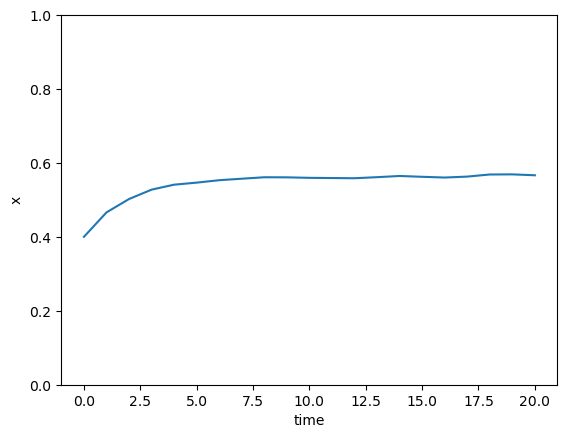

In [6]:
rows = 200
cols = 200
s = 0.5
m = 0.55
alpha = 1.8
tmax = 50 
seed = 20
x0 = 0.4

G, learning_style , opinions = create_lattice_network(rows, cols, s, seed, x0=x0)
#print(opinions)
out = convergence(G, rows, cols, tmax, m, alpha, seed, tol = 0.02 )#flag1= True)
if out["converge"] == 1:  
    Gnew = out["Network"]

    #plot_network (Gnew)
t_ = out["tConv"] 
Gnew = out["Network"]
#opinion_matrix = out["opinionlist"]
#print(opinion_matrix)
xList= out["avg_op_list"]
plt.plot(xList)
plt.ylim([0, 1])
plt.xlabel("time")
plt.ylabel("x")
#print(xList)

In [7]:

G, learning_style , opinions = create_lattice_network(rows, cols, s, seed)
#convergence (G, rows, cols, tmax, m, alpha, tol= 0.002, window = 30, mind_lenght = 10)
#print(opinions)
updated = update_all(G, rows, cols, m, alpha, seed )
Gnew = updated["network"]
opinion_matrix = updated["opinion_matrix"], 
#Dice = updated["dice"]



KeyError: 'opinion_matrix'

# animation of the opinion changes in the system over time
changes in the network

In [15]:
rows = 4
cols = 4
s = 0.95
m = 0.75
alpha = 1.8
tmax = 40 
seed = 20

G, learning_style , opinions = create_lattice_network(rows, cols,s, seed)

output = convergence (G, rows, cols, tmax, m, alpha, seed, flag1=True)
opinion_matrix = output["opinionlist"], 
opinion_matrix1 = opinion_matrix[0]
t_ = output["tConv"] +2

In [20]:
print(opinion_matrix1)

[array([[1, 1, 0, 1],
        [1, 0, 0, 1],
        [0, 1, 1, 0],
        [0, 1, 1, 1]]) array([[1, 1, 0, 0],
                              [1, 0, 0, 1],
                              [0, 0, 0, 0],
                              [1, 1, 1, 0]]) array([[1, 0, 0, 0],
                                                    [0, 0, 0, 0],
                                                    [0, 0, 0, 0],
                                                    [0, 0, 0, 0]])
 array([[1, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]]) array([[0, 0, 0, 0],
                              [0, 0, 0, 0],
                              [0, 0, 0, 0],
                              [0, 0, 0, 0]]) array([[0, 0, 0, 0],
                                                    [0, 0, 0, 0],
                                                    [0, 0, 0, 0],
                                                    [0, 0, 0, 0]])
 array([[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        

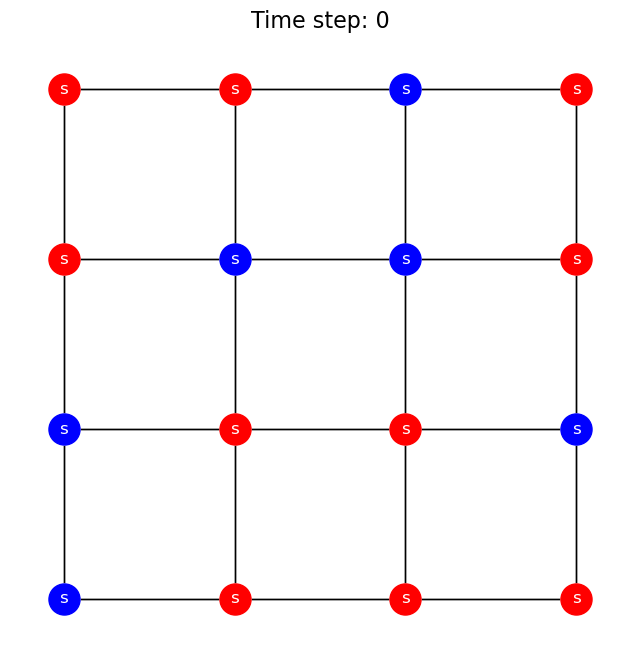

In [29]:
def update(frame):
    draw_grid(ax, G, opinion_matrix1[frame], learning_style, frame, pos)
# Create the plot


# Create the plot
fig, ax = plt.subplots(figsize=(8, 8))
pos = {(x, y): (y, -x) for x, y in G.nodes()}



ani = animation.FuncAnimation(fig, update, frames=t_, interval=200, repeat=True)
# To display the animation in Jupyter notebooks (if needed)

#HTML(ani.to_jshtml())
# Show the animation (for script execution)
#lt.show()
ani.save("opinion_party.gif", dpi=300, writer=PillowWriter(fps=25))

[[1 0 0 0 0 0 0 1 1 1]
 [0 0 0 0 0 1 1 1 1 0]
 [1 1 0 0 1 1 0 1 0 1]
 [0 0 1 0 1 0 1 1 1 0]
 [0 0 0 1 1 1 0 1 0 1]
 [0 1 0 1 1 0 0 0 1 1]
 [1 1 1 1 1 0 1 1 0 1]
 [1 0 0 1 1 0 0 1 1 1]
 [0 1 1 0 1 1 1 1 1 0]
 [0 0 1 0 1 0 0 0 1 1]]
[[1 1 0 1 1 1 1 0 1 1]
 [1 0 0 1 1 1 0 0 0 1]
 [1 1 1 0 1 1 1 1 1 1]
 [0 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 1 1 0 0 1 0]
 [0 1 0 1 0 0 1 0 0 0]
 [0 1 0 0 1 0 1 0 0 1]
 [1 0 0 0 1 1 0 1 0 0]
 [1 1 1 0 0 0 1 0 1 0]
 [0 0 1 0 0 0 0 0 0 0]]


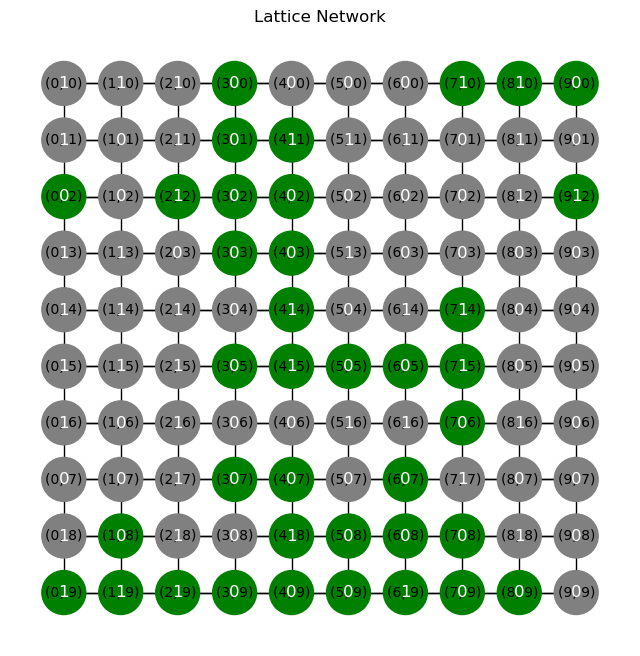

KeyError: 'opinionlist'

In [137]:
rows = 10
cols = 10
s = 0.5
m = 0.55
alpha = 1.8
tmax = 500 
seed = 3
G, learning_style , opinions = create_lattice_network(rows, cols, s, seed, x0)
print(opinions)
print(learning_style)
out = convergence(G, rows, cols, tmax, m, alpha, seed, tol = 0.05, )
if out["converge"] == 1:  
    Gnew = out["Network"]

    plot_network (Gnew, learning_style)
t_ = out["tConv"]
Gnew = out["Network"]
opinion_matrix = out["opinionlist"]

xList= out["avg_op_list"]
plt.plot(xList)
plt.ylim([0, 1])
plt.xlabel("time")
plt.ylabel("x")
print(xList)







In [326]:

rows = 10
cols = 10
s = 0.1
G, learning_style , opinions = create_lattice_network(rows, cols,s, seed)

output = convergence (G, rows, cols, tmax, m, alpha, seed)
opinion_matrix = output["opinionlist"], 
opinion_matrix1 = opinion_matrix[0]
t_ = output["tConv"] +1

In [333]:

def update(frame):
    draw_grid(ax, G, opinion_matrix1[frame], learning_style, frame, pos)
# Create the plot


[[0 0 0 0 0 0 1 1 1 0]
 [1 1 0 0 1 0 0 0 1 1]
 [0 1 0 1 0 1 0 0 1 0]
 [1 1 1 1 0 1 1 0 0 1]
 [1 0 1 0 1 0 0 0 1 1]
 [1 1 0 0 0 0 1 1 0 1]
 [0 1 1 0 1 0 1 0 0 0]
 [1 0 1 0 0 1 1 1 0 1]
 [0 0 0 0 0 1 1 1 1 1]
 [0 1 1 0 1 0 1 0 0 0]]
[[0 0 0 0 0 0 1 1 1 0]
 [1 1 0 0 1 0 0 0 1 1]
 [0 1 0 1 0 1 0 0 1 0]
 [1 1 1 1 0 1 1 0 0 1]
 [1 0 1 0 1 0 0 0 1 1]
 [1 1 0 0 0 0 1 1 0 1]
 [0 1 1 0 1 0 1 0 0 0]
 [1 0 1 0 0 1 1 1 0 1]
 [0 0 0 0 0 1 1 1 1 1]
 [0 1 1 0 1 0 1 0 0 0]]
[[0 0 0 0 0 0 1 1 1 0]
 [1 1 0 0 1 0 0 0 1 1]
 [0 1 0 1 0 1 0 0 1 0]
 [1 1 1 1 0 1 1 0 0 1]
 [1 0 1 0 1 0 0 0 1 1]
 [1 1 0 0 0 0 1 1 0 1]
 [0 1 1 0 1 0 1 0 0 0]
 [1 0 1 0 0 1 1 1 0 1]
 [0 0 0 0 0 1 1 1 1 1]
 [0 1 1 0 1 0 1 0 0 0]]
[[0 0 0 0 0 0 1 1 1 0]
 [1 1 0 0 1 0 0 0 1 1]
 [0 1 0 1 0 1 0 0 1 0]
 [1 1 1 1 0 1 1 0 0 1]
 [1 0 1 0 1 0 0 0 1 1]
 [1 1 0 0 0 0 1 1 0 1]
 [0 1 1 0 1 0 1 0 0 0]
 [1 0 1 0 0 1 1 1 0 1]
 [0 0 0 0 0 1 1 1 1 1]
 [0 1 1 0 1 0 1 0 0 0]]
[[0 0 0 0 0 0 1 1 1 0]
 [1 1 0 0 1 0 0 0 1 1]
 [0 1 0 1 0 1 0 0 1 0]
 [1 1 1

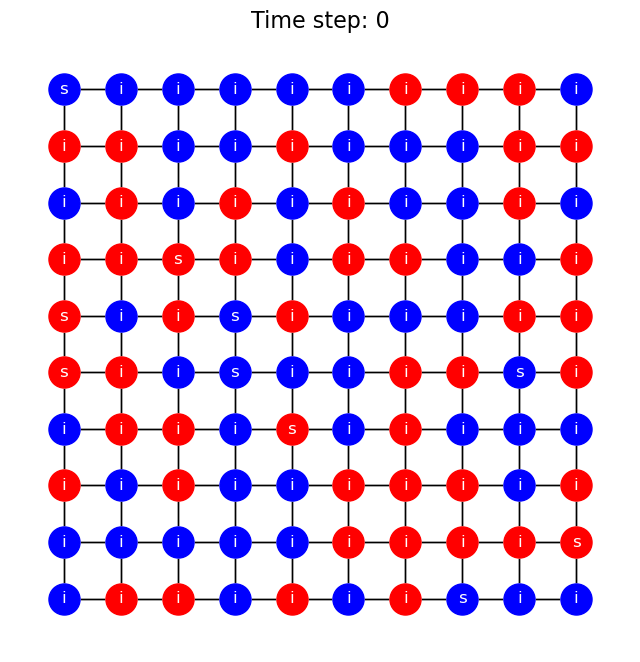

In [334]:



fig, ax = plt.subplots(figsize=(8, 8))
pos = {(x, y): (y, -x) for x, y in G.nodes()}




ani = animation.FuncAnimation(fig, update, frames=t_, interval=200, repeat=True)
# To display the animation in Jupyter notebooks (if needed)
from IPython.display import HTML
#HTML(ani.to_jshtml())
# Show the animation (for script execution)
#lt.show()
ani.save("opinion_party_s=0.05.gif", dpi=300, writer=PillowWriter(fps=25))
